In [20]:
import os
import time

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

from torchvision import datasets
from torchvision import transforms

import matplotlib.pyplot as plt
from PIL import Image
torch.backends.cudnn.deterministic = True

In [21]:
NUM_CLASSES = 9
ZDIM = 5
BATCH_SIZE = 128

In [22]:
transform_train = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

def delete_class(dataset, to_delete):
    targets = np.array([np.where(np.array(dataset.targets) != to_delete)])[0][0]
    dataset.targets = np.array(dataset.targets)[targets]
    dataset.data = dataset.data[targets]
    
    return dataset

def mv_class(dataset, from_, to):
    targets = np.array([np.where(np.array(dataset.targets) == from_)])[0][0]
    dataset.targets = np.array(dataset.targets)
    dataset.targets[targets] = to
    
    return dataset

train_dataset = datasets.CIFAR10(root='data',
                                 train=True, 
                                 transform=transform_train,
                                 download=True)

test_dataset = datasets.CIFAR10(root='data',
                                train=False, 
                                transform=transform_test)
test_dataset_show = datasets.CIFAR10(root='data', train=False)

train_loader = DataLoader(dataset=train_dataset, 
                          batch_size=BATCH_SIZE,
                          num_workers=20,
                          shuffle=True)

test_loader = DataLoader(dataset=test_dataset, 
                         batch_size=BATCH_SIZE,
                         num_workers=20,
                         shuffle=False)

Files already downloaded and verified


In [23]:
import pytorch_lightning as pl
from bottleneckresnet import resnet18


class ResNetFuzzy(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.model = resnet18(num_classes=NUM_CLASSES, z_dim=ZDIM, fuzzy=True)
        self.loss = nn.BCELoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_no):
        x, y = batch
        logits, _ = self(x)
        Y = torch.zeros(logits.shape, dtype=torch.float32, device='cuda')
        for i in range(len(y)):
            ind = y[i]
            Y[i, ind] = 1
        y = Y

        loss = self.loss(logits, y)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.SGD(self.model.parameters(), lr=0.1, momentum=0.9, weight_decay=5e-4)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)
        return [optimizer], [scheduler]


class ResNetSimple(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.model = resnet18(num_classes=NUM_CLASSES, z_dim=ZDIM, fuzzy=False)
        self.loss = nn.CrossEntropyLoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_no):
        x, y = batch
        logits, _ = self(x)
        loss = self.loss(logits, y)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.SGD(self.model.parameters(), lr=0.1, momentum=0.9, weight_decay=5e-4)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)
        return [optimizer], [scheduler]

In [24]:
fuzzy_model = ResNetFuzzy.load_from_checkpoint(f"resnet18-{ZDIM}-fuzzy_2.pt", map_location="cuda")
simple_model = ResNetSimple.load_from_checkpoint(f"resnet18-{ZDIM}-simple_2.pt", map_location="cuda")

In [25]:
from tqdm.autonotebook import tqdm

def get_prediction(x, model: pl.LightningModule):
    model.freeze()
    pred, z = model(x.to('cuda'))
    probabilities = torch.softmax(pred, dim=1)
    predicted_class = torch.argmax(probabilities, dim=1)
    return predicted_class, pred, z

simple_true_y, simple_pred_y, simple_probs, simple_z = [], [], [], []
for batch in tqdm(iter(test_loader), total=len(test_loader)):
    x, y = batch
    simple_true_y.extend(y)
    preds, probs, z = get_prediction(x, simple_model)
    simple_z.extend(z.cpu())
    simple_pred_y.extend(preds.cpu())
    simple_probs.extend(probs.cpu())

fuzzy_true_y, fuzzy_pred_y, fuzzy_probs, fuzzy_z = [], [], [], []
for batch in tqdm(iter(test_loader), total=len(test_loader)):
    x, y = batch
    fuzzy_true_y.extend(y)
    preds, probs, z = get_prediction(x, fuzzy_model)
    fuzzy_z.extend(z.cpu())
    fuzzy_pred_y.extend(preds.cpu())
    fuzzy_probs.extend(probs.cpu())

simple_z = np.asarray([z.numpy() for z in simple_z])
fuzzy_z = np.asarray([z.numpy() for z in fuzzy_z])
simple_true_y = np.asarray([z.numpy() for z in simple_true_y])
simple_pred_y = np.asarray([z.numpy() for z in simple_pred_y])
fuzzy_true_y = np.asarray([z.numpy() for z in fuzzy_true_y])
fuzzy_pred_y = np.asarray([z.numpy() for z in fuzzy_pred_y])
simple_probs = np.asarray([z.numpy() for z in simple_probs])
fuzzy_probs = np.asarray([z.numpy() for z in fuzzy_probs])

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

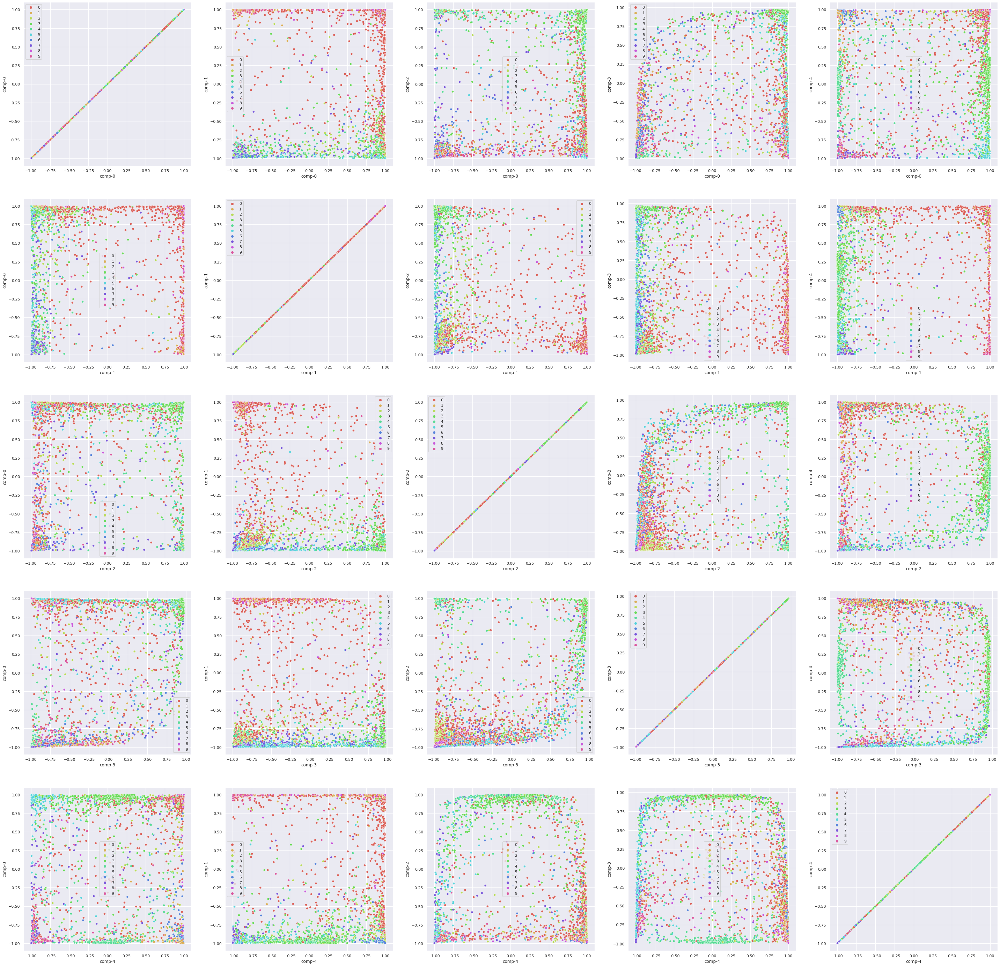

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


sns.set(rc={'figure.figsize':(10 * ZDIM, 10 * ZDIM)})
fig, axs = plt.subplots(ZDIM, ZDIM)

df = pd.DataFrame()
df["y"] = fuzzy_true_y

for i in range(ZDIM):
    for j in range(ZDIM):
        df[f"comp-{i}"] = fuzzy_z[:,i]
        df[f"comp-{j}"] = fuzzy_z[:,j]

for i in range(ZDIM):
    for j in range(ZDIM):
        sns.scatterplot(
            ax=axs[i][j],
            x=f"comp-{i}", y=f"comp-{j}",
            hue=df.y.tolist(),
            palette=sns.color_palette("hls", 10),
            data=df)
plt.savefig(f"comps-fuzzy-ZDIM{ZDIM}.jpg")

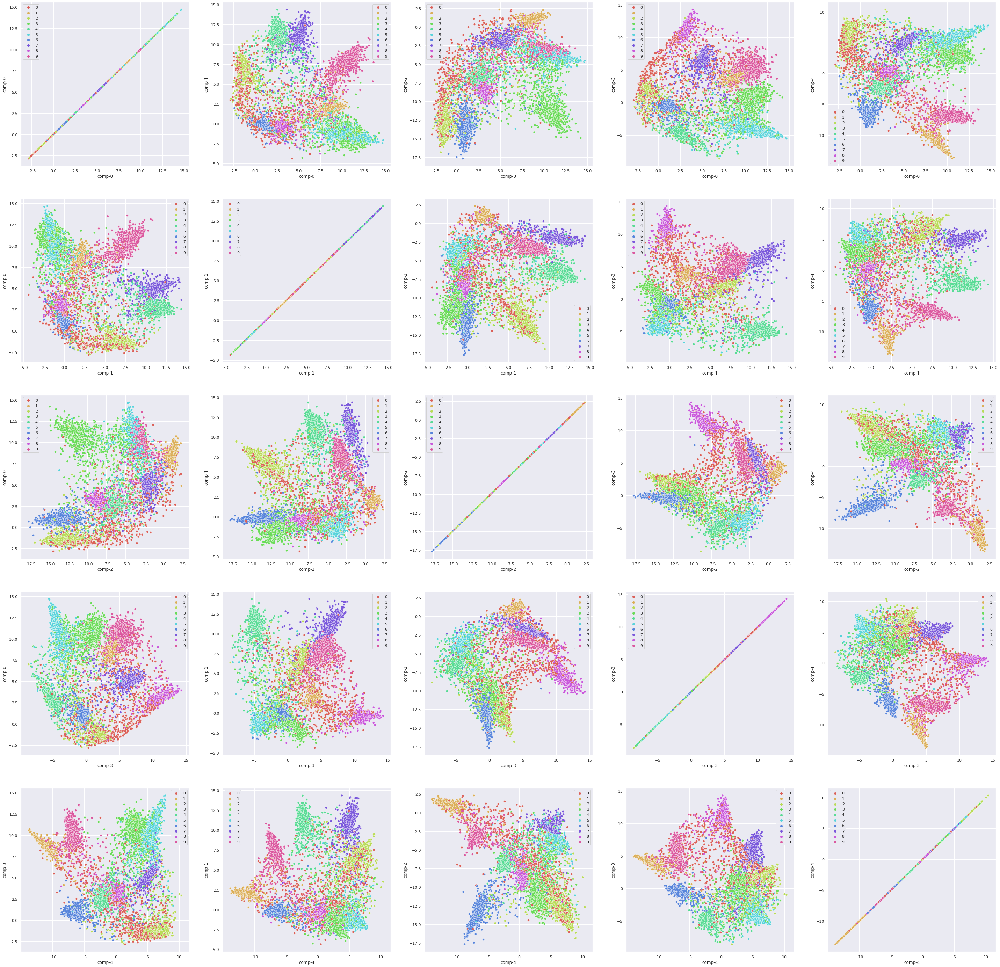

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


sns.set(rc={'figure.figsize':(10 * ZDIM, 10 * ZDIM)})
fig, axs = plt.subplots(ZDIM, ZDIM)

df = pd.DataFrame()
df["y"] = simple_true_y

for i in range(ZDIM):
    for j in range(ZDIM):
        df[f"comp-{i}"] = simple_z[:,i]
        df[f"comp-{j}"] = simple_z[:,j]

for i in range(ZDIM):
    for j in range(ZDIM):
        sns.scatterplot(
            ax=axs[i][j],
            x=f"comp-{i}", y=f"comp-{j}",
            hue=df.y.tolist(),
            palette=sns.color_palette("hls", 10),
            data=df)
plt.savefig(f"comps-simple-ZDIM{ZDIM}.jpg")